In [ ]:
!python -m pip install pyyaml==6.0.2
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Cloning into 'detectron2'...
remote: Enumerating objects: 15792, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 15792 (delta 15), reused 27 (delta 10), pack-reused 15743 (from 1)
Receiving objects: 100% (15792/15792), 6.37 MiB | 9.28 MiB/s, done.
Resolving deltas: 100% (11507/11507), done.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 58.1 MB/s eta 0:00

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import cv2
import json
from tqdm import tqdm

# Base directories for train, test, and validation image sets and their labels
base_dir = '/content/drive/My Drive/IDRID'
image_dirs = {
    "train": os.path.join(base_dir, 'Support/balanced and preprocessed and CLAHEd and denoised images'),
    "test": os.path.join(base_dir, 'Test/balanced and preprocessed and CLAHEd and denoised images'),
    "validation": os.path.join(base_dir, 'Val/balanced and preprocessed and CLAHEd and denoised images')
}
label_dirs = {
    "train": {
        "Microaneurysms": os.path.join(base_dir, 'Support/raw labels/Microaneurysms'),
        "Hard Exudates": os.path.join(base_dir, 'Support/raw labels/Hard Exudates'),
        "Soft Exudates": os.path.join(base_dir, 'Support/raw labels/Soft Exudates'),
        "Optic Disc": os.path.join(base_dir, 'Support/raw labels/Optic Disc'),
        "Haemorrhages": os.path.join(base_dir, 'Support/raw labels/Haemorrhages')
    },
    "test": {
        "Microaneurysms": os.path.join(base_dir, 'Test/raw labels/Microaneurysms'),
        "Hard Exudates": os.path.join(base_dir, 'Test/raw labels/Hard Exudates'),
        "Soft Exudates": os.path.join(base_dir, 'Test/raw labels/Soft Exudates'),
        "Optic Disc": os.path.join(base_dir, 'Test/raw labels/Optic Disc'),
        "Haemorrhages": os.path.join(base_dir, 'Test/raw labels/Haemorrhages')
    },
    "validation": {
        "Microaneurysms": os.path.join(base_dir, 'Val/raw labels/Microaneurysms'),
        "Hard Exudates": os.path.join(base_dir, 'Val/raw labels/Hard Exudates'),
        "Soft Exudates": os.path.join(base_dir, 'Val/raw labels/Soft Exudates'),
        "Optic Disc": os.path.join(base_dir, 'Val/raw labels/Optic Disc'),
        "Haemorrhages": os.path.join(base_dir, 'Val/raw labels/Haemorrhages')
    }
}

# Define label suffixes based on lesion type
label_suffixes = {
    "Microaneurysms": "_MA.tif",
    "Hard Exudates": "_EX.tif",
    "Soft Exudates": "_SE.tif",
    "Optic Disc": "_OD.tif",
    "Haemorrhages": "_HE.tif"
}

# Define categories for annotation JSON structure
categories = [
    {"id": 1, "name": "Microaneurysms"},
    {"id": 2, "name": "Hard Exudates"},
    {"id": 3, "name": "Soft Exudates"},
    {"id": 4, "name": "Optic Disc"},
    {"id": 5, "name": "Haemorrhages"}
]

# Function to create annotation JSON for each dataset part
def create_annotation_json(dataset_part):
    images_folder = image_dirs[dataset_part]
    labels_folders = label_dirs[dataset_part]

    # Initialize annotation structure
    annotation_data = {
        "images": [],
        "annotations": [],
        "categories": categories
    }
    annotation_id = 1

    # List all image files in the specified folder
    image_files = sorted([f for f in os.listdir(images_folder) if f.endswith('.jpg')])

    # Loop through the images
    for image_id, image_filename in tqdm(enumerate(image_files), total=len(image_files), desc=f"Processing {dataset_part} images"):
        image_path = os.path.join(images_folder, image_filename)
        image = cv2.imread(image_path)
        height, width, _ = image.shape

        # Extract image base name without the extension
        base_name = image_filename.replace('.jpg', '')

        # Add image information to the JSON structure
        annotation_data["images"].append({
            "id": image_id + 1,  # Ensure IDs are unique and start from 1
            "file_name": image_filename,
            "width": width,
            "height": height
        })

        # Process labels for each lesion type
        for category_name, label_folder in labels_folders.items():
            # Define label file path
            label_filename = base_name + label_suffixes[category_name]
            label_path = os.path.join(label_folder, label_filename)

            # Check if label file exists
            if not os.path.exists(label_path):
                continue

            # Read the label image and process it
            label = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
            _, binary_label = cv2.threshold(label, 1, 255, cv2.THRESH_BINARY)

            # Find contours
            contours, _ = cv2.findContours(binary_label, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            # Generate annotation data for each contour
            for contour in contours:
                x, y, w, h = cv2.boundingRect(contour)
                segmentation = contour.flatten().tolist()

                annotation = {
                    "id": annotation_id,
                    "image_id": image_id + 1,
                    "category_id": list(labels_folders.keys()).index(category_name) + 1,
                    "bbox": [x, y, w, h],
                    "segmentation": [segmentation],
                    "area": cv2.contourArea(contour),
                    "iscrowd": 0
                }

                annotation_data["annotations"].append(annotation)
                annotation_id += 1

    # Save the JSON file for the current dataset part
    output_json_path = os.path.join(base_dir, f'{dataset_part}_annotations.json')
    with open(output_json_path, 'w') as json_file:
        json.dump(annotation_data, json_file, indent=4)

    print(f"Annotation JSON for {dataset_part} saved to: {output_json_path}")

# Run the function for train, test, and validation parts
create_annotation_json('train')
create_annotation_json('test')
create_annotation_json('validation')

Processing train images: 100%|██████████| 54/54 [08:34<00:00,  9.54s/it]


Annotation JSON for train saved to: /content/drive/My Drive/IDRID/train_annotations.json


Processing test images: 100%|██████████| 22/22 [04:17<00:00, 11.69s/it]


Annotation JSON for test saved to: /content/drive/My Drive/IDRID/test_annotations.json


Processing validation images: 100%|██████████| 5/5 [01:02<00:00, 12.56s/it]

Annotation JSON for validation saved to: /content/drive/My Drive/IDRID/validation_annotations.json


In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.5 ; cuda:  cu121
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
my_dataset_train ='/content/drive/My Drive/IDRID/Support/balanced and preprocessed and CLAHEd and denoised images'
my_dataset_val = '/content/drive/My Drive/IDRID/Val/balanced and preprocessed and CLAHEd and denoised images'
my_dataset_test ='/content/drive/My Drive/IDRID/Test/balanced and preprocessed and CLAHEd and denoised images'

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/My Drive/IDRID/train_annotations.json", "/content/drive/My Drive/IDRID/Support/balanced and preprocessed and CLAHEd and denoised images")
register_coco_instances("my_dataset_val", {}, "/content/drive/My Drive/IDRID/validation_annotations.json", "/content/drive/My Drive/IDRID/Val/balanced and preprocessed and CLAHEd and denoised images")

In [ ]:
train_metadata = MetadataCatalog.get("my_dataset_train")
train_dataset_dicts = DatasetCatalog.get("my_dataset_train")
val_metadata = MetadataCatalog.get("my_dataset_val")
val_dataset_dicts = DatasetCatalog.get("my_dataset_val")

[10/25 10:51:50 d2.data.datasets.coco]: Loaded 54 images in COCO format from /content/drive/My Drive/IDRID/train_annotations.json
WARNING [10/25 10:51:50 d2.data.datasets.coco]: Filtered out 838 instances without valid segmentation. There might be issues in your dataset generation process.  Please check https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html carefully
[10/25 10:51:50 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/drive/My Drive/IDRID/validation_annotations.json


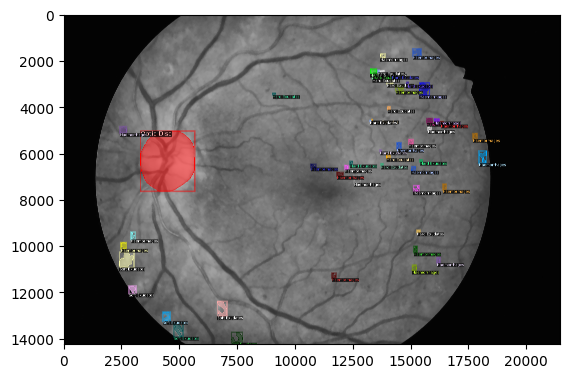

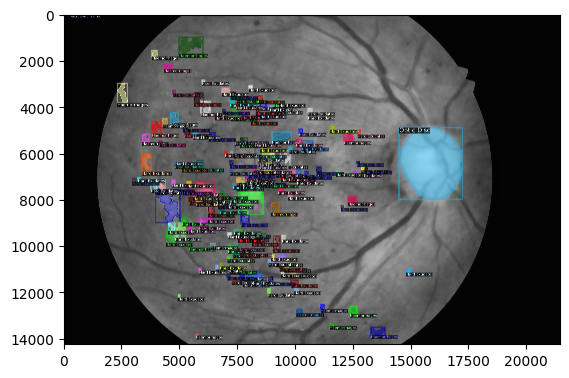

In [ ]:
from matplotlib import pyplot as plt
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00020  # pick a good LR
cfg.SOLVER.MAX_ITER = 1200    # 1000 iterations seems good enough for this dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5  # We have 5 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available



[10/25 10:54:04 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:00, 188MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


In [ ]:
trainer.train() #Start the training process

[10/25 10:54:12 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[10/25 10:54:39 d2.utils.events]:  eta: 0:20:46  iter: 19  total_loss: 10.77  loss_cls: 1.849  loss_box_reg: 0.2134  loss_mask: 0.694  loss_rpn_cls: 6.909  loss_rpn_loc: 1.091    time: 1.1041  last_time: 1.5647  data_time: 0.5054  last_data_time: 0.9099   lr: 3.9962e-06  max_mem: 4366M
[10/25 10:55:06 d2.utils.events]:  eta: 0:19:54  iter: 39  total_loss: 7.819  loss_cls: 1.753  loss_box_reg: 0.2868  loss_mask: 0.6931  loss_rpn_cls: 4.115  loss_rpn_loc: 0.9806    time: 1.0857  last_time: 0.9991  data_time: 0.4845  last_data_time: 0.3925   lr: 7.9922e-06  max_mem: 4377M
[10/25 10:55:31 d2.utils.events]:  eta: 0:20:02  iter: 59  total_loss: 4.291  loss_cls: 1.609  loss_box_reg: 0.2785  loss_mask: 0.6911  loss_rpn_cls: 0.9607  loss_rpn_loc: 0.7744    time: 1.1358  last_time: 1.1035  data_time: 0.6314  last_data_time: 0.5387   lr: 1.1988e-05  max_mem: 4660M
[10/25 10:55:55 d2.utils.events]:  eta: 0:19:39  iter: 79  total_loss: 3.438  loss_cls: 1.346  loss_box_reg: 0.219  loss_mask: 0.6884 

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
import yaml
# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = "/content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models/config.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4  # set a custom testing threshold
predictor = DefaultPredictor(cfg)


[10/25 11:23:16 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models/model_final.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

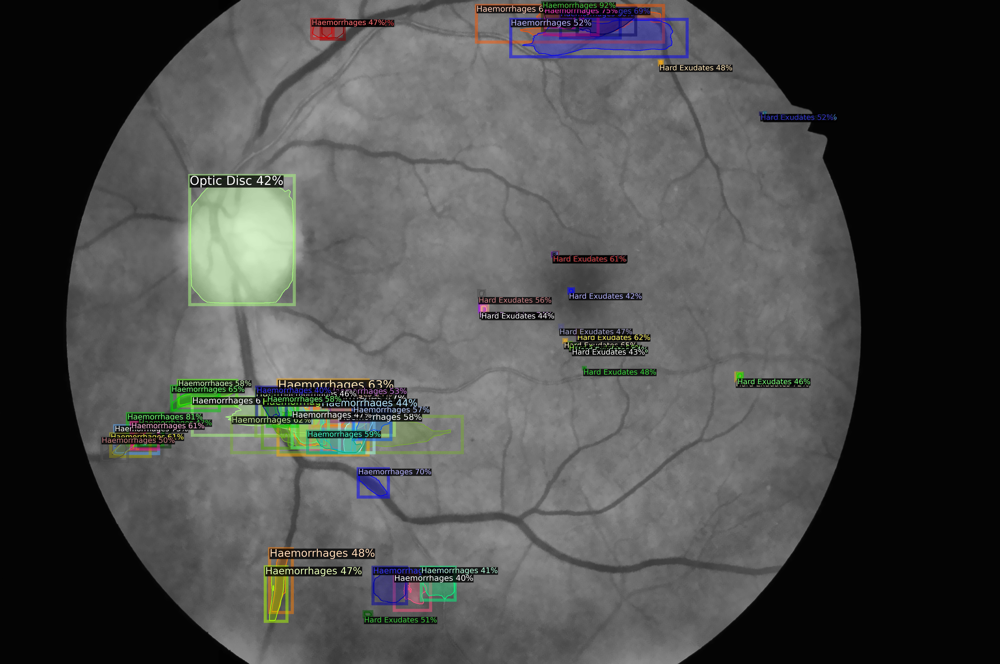

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 1):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=2,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
import json
import numpy as np
import cv2
from sklearn.metrics import jaccard_score
from detectron2.utils.visualizer import Visualizer, ColorMode
import os

# Load ground truth and predictions JSON
with open('/content/drive/My Drive/IDRID/train_annotations.json') as gt_file:
    gt_annotations = json.load(gt_file)

# Define function to create binary masks for each category
def create_binary_mask(annotations, category_id, img_height, img_width):
    mask = np.zeros((img_height, img_width), dtype=np.uint8)
    for ann in annotations:
        if ann["category_id"] == category_id:
            for seg in ann["segmentation"]:
                contour = np.array(seg).reshape(-1, 2).astype(np.int32)
                cv2.fillPoly(mask, [contour], 1)
    return mask

# Calculate Dice Score for each category with zero-denominator handling
def dice_score(pred_mask, gt_mask):
    intersection = np.sum(pred_mask * gt_mask)
    denominator = np.sum(pred_mask) + np.sum(gt_mask)
    if denominator == 0:
        # Handle case where both masks are empty
        return 0.0 if np.sum(gt_mask) > 0 else 1.0
    return (2 * intersection) / denominator

# Process each image and calculate Dice scores for each class
dice_scores = {category["name"]: [] for category in gt_annotations["categories"]}

for img_data in gt_annotations["images"]:
    # Load ground truth masks per category
    img_id = img_data["id"]
    img_height, img_width = img_data["height"], img_data["width"]

    for category in gt_annotations["categories"]:
        cat_id = category["id"]
        # Get ground truth mask
        gt_mask = create_binary_mask(
            [ann for ann in gt_annotations["annotations"] if ann["image_id"] == img_id],
            cat_id, img_height, img_width
        )

        # Get prediction mask from the model
        im = cv2.imread(os.path.join('/content/drive/My Drive/IDRID/Support/balanced and preprocessed and CLAHEd and denoised images', img_data["file_name"]))
        outputs = predictor(im)

        pred_mask = np.zeros((img_height, img_width), dtype=np.uint8)
        for i in range(len(outputs["instances"].pred_classes)):
            if outputs["instances"].pred_classes[i] == cat_id - 1:  # Ensure 0-indexed
                pred_mask += outputs["instances"].pred_masks[i].cpu().numpy().astype(np.uint8)

        # Calculate Dice score
        dice = dice_score(pred_mask, gt_mask)
        dice_scores[category["name"]].append(dice)

# Average Dice score per class
average_dice_scores = {k: np.mean(v) for k, v in dice_scores.items()}
print("Average Dice Scores per Class:", average_dice_scores)


Average Dice Scores per Class: {'Microaneurysms': 0.0, 'Hard Exudates': 0.45675402353865213, 'Soft Exudates': 0.5185185185185185, 'Optic Disc': 0.23560823964617647, 'Haemorrhages': 0.26028321487153994}


In [ ]:
import json
import numpy as np
import cv2
from sklearn.metrics import jaccard_score
from detectron2.utils.visualizer import Visualizer, ColorMode
import os

# Load ground truth and predictions JSON
with open('/content/drive/My Drive/IDRID/test_annotations.json') as gt_file:
    gt_annotations = json.load(gt_file)

# Define function to create binary masks for each category
def create_binary_mask(annotations, category_id, img_height, img_width):
    mask = np.zeros((img_height, img_width), dtype=np.uint8)
    for ann in annotations:
        if ann["category_id"] == category_id:
            for seg in ann["segmentation"]:
                contour = np.array(seg).reshape(-1, 2).astype(np.int32)
                cv2.fillPoly(mask, [contour], 1)
    return mask

# Calculate Dice Score for each category with zero-denominator handling
def dice_score(pred_mask, gt_mask):
    intersection = np.sum(pred_mask * gt_mask)
    denominator = np.sum(pred_mask) + np.sum(gt_mask)
    if denominator == 0:
        # Handle case where both masks are empty
        return 0.0 if np.sum(gt_mask) > 0 else 1.0
    return (2 * intersection) / denominator

# Process each image and calculate Dice scores for each class
dice_scores = {category["name"]: [] for category in gt_annotations["categories"]}

for img_data in gt_annotations["images"]:
    # Load ground truth masks per category
    img_id = img_data["id"]
    img_height, img_width = img_data["height"], img_data["width"]

    for category in gt_annotations["categories"]:
        cat_id = category["id"]
        # Get ground truth mask
        gt_mask = create_binary_mask(
            [ann for ann in gt_annotations["annotations"] if ann["image_id"] == img_id],
            cat_id, img_height, img_width
        )

        # Get prediction mask from the model
        im = cv2.imread(os.path.join('/content/drive/My Drive/IDRID/Test/balanced and preprocessed and CLAHEd and denoised images', img_data["file_name"]))
        outputs = predictor(im)

        pred_mask = np.zeros((img_height, img_width), dtype=np.uint8)
        for i in range(len(outputs["instances"].pred_classes)):
            if outputs["instances"].pred_classes[i] == cat_id - 1:  # Ensure 0-indexed
                pred_mask += outputs["instances"].pred_masks[i].cpu().numpy().astype(np.uint8)

        # Calculate Dice score
        dice = dice_score(pred_mask, gt_mask)
        dice_scores[category["name"]].append(dice)

# Average Dice score per class
average_dice_scores = {k: np.mean(v) for k, v in dice_scores.items()}
print("Average Dice Scores per Class:", average_dice_scores)


Average Dice Scores per Class: {'Microaneurysms': 0.0, 'Hard Exudates': 0.47792075349298757, 'Soft Exudates': 0.4090909090909091, 'Optic Disc': 0.12274257275710097, 'Haemorrhages': 0.25434720440877856}


In [ ]:
import json
import numpy as np
import cv2
from sklearn.metrics import jaccard_score
from detectron2.utils.visualizer import Visualizer, ColorMode
import os

# Load ground truth and predictions JSON
with open('/content/drive/My Drive/IDRID/validation_annotations.json') as gt_file:
    gt_annotations = json.load(gt_file)

# Define function to create binary masks for each category
def create_binary_mask(annotations, category_id, img_height, img_width):
    mask = np.zeros((img_height, img_width), dtype=np.uint8)
    for ann in annotations:
        if ann["category_id"] == category_id:
            for seg in ann["segmentation"]:
                contour = np.array(seg).reshape(-1, 2).astype(np.int32)
                cv2.fillPoly(mask, [contour], 1)
    return mask

# Calculate Dice Score for each category with zero-denominator handling
def dice_score(pred_mask, gt_mask):
    intersection = np.sum(pred_mask * gt_mask)
    denominator = np.sum(pred_mask) + np.sum(gt_mask)
    if denominator == 0:
        # Handle case where both masks are empty
        return 0.0 if np.sum(gt_mask) > 0 else 1.0
    return (2 * intersection) / denominator

# Process each image and calculate Dice scores for each class
dice_scores = {category["name"]: [] for category in gt_annotations["categories"]}

for img_data in gt_annotations["images"]:
    # Load ground truth masks per category
    img_id = img_data["id"]
    img_height, img_width = img_data["height"], img_data["width"]

    for category in gt_annotations["categories"]:
        cat_id = category["id"]
        # Get ground truth mask
        gt_mask = create_binary_mask(
            [ann for ann in gt_annotations["annotations"] if ann["image_id"] == img_id],
            cat_id, img_height, img_width
        )

        # Get prediction mask from the model
        im = cv2.imread(os.path.join('/content/drive/My Drive/IDRID/Val/balanced and preprocessed and CLAHEd and denoised images', img_data["file_name"]))
        outputs = predictor(im)

        pred_mask = np.zeros((img_height, img_width), dtype=np.uint8)
        for i in range(len(outputs["instances"].pred_classes)):
            if outputs["instances"].pred_classes[i] == cat_id - 1:  # Ensure 0-indexed
                pred_mask += outputs["instances"].pred_masks[i].cpu().numpy().astype(np.uint8)

        # Calculate Dice score
        dice = dice_score(pred_mask, gt_mask)
        dice_scores[category["name"]].append(dice)

# Average Dice score per class
average_dice_scores = {k: np.mean(v) for k, v in dice_scores.items()}
print("Average Dice Scores per Class:", average_dice_scores)


Average Dice Scores per Class: {'Microaneurysms': 0.0, 'Hard Exudates': 0.42640940257676185, 'Soft Exudates': 0.8, 'Optic Disc': 0.5448578916518432, 'Haemorrhages': 0.3492104938430331}


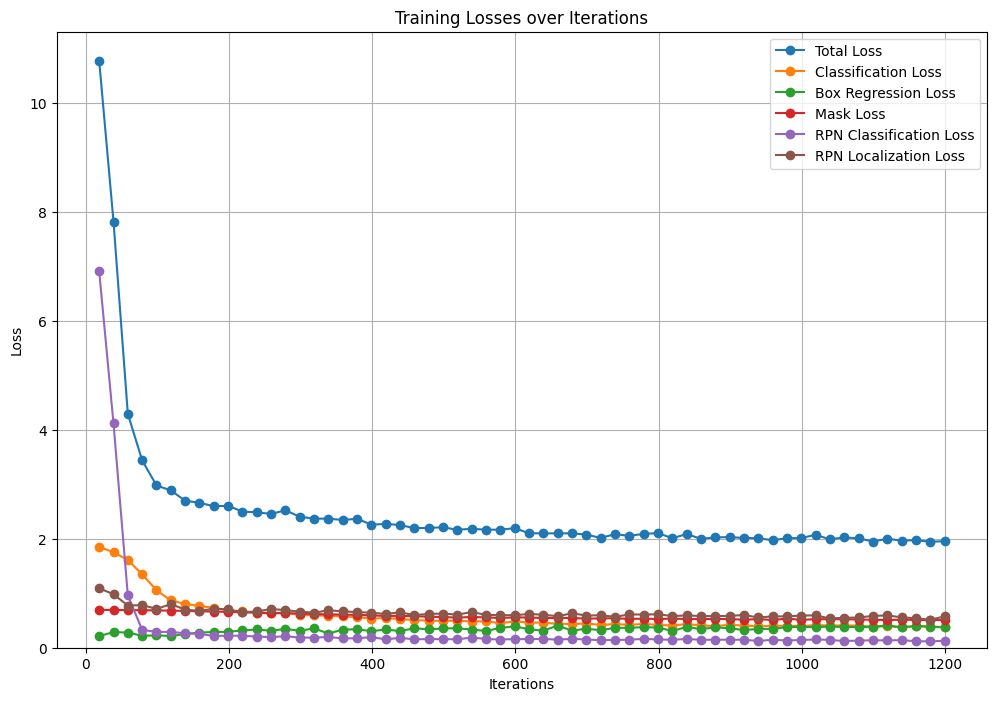

In [ ]:
import matplotlib.pyplot as plt
import re

# Log data as a multi-line string
log_data = """
[10/25 10:54:39 d2.utils.events]:  eta: 0:20:46  iter: 19  total_loss: 10.77  loss_cls: 1.849  loss_box_reg: 0.2134  loss_mask: 0.694  loss_rpn_cls: 6.909  loss_rpn_loc: 1.091    time: 1.1041  last_time: 1.5647  data_time: 0.5054  last_data_time: 0.9099   lr: 3.9962e-06  max_mem: 4366M
[10/25 10:55:06 d2.utils.events]:  eta: 0:19:54  iter: 39  total_loss: 7.819  loss_cls: 1.753  loss_box_reg: 0.2868  loss_mask: 0.6931  loss_rpn_cls: 4.115  loss_rpn_loc: 0.9806    time: 1.0857  last_time: 0.9991  data_time: 0.4845  last_data_time: 0.3925   lr: 7.9922e-06  max_mem: 4377M
[10/25 10:55:31 d2.utils.events]:  eta: 0:20:02  iter: 59  total_loss: 4.291  loss_cls: 1.609  loss_box_reg: 0.2785  loss_mask: 0.6911  loss_rpn_cls: 0.9607  loss_rpn_loc: 0.7744    time: 1.1358  last_time: 1.1035  data_time: 0.6314  last_data_time: 0.5387   lr: 1.1988e-05  max_mem: 4660M
[10/25 10:55:55 d2.utils.events]:  eta: 0:19:39  iter: 79  total_loss: 3.438  loss_cls: 1.346  loss_box_reg: 0.219  loss_mask: 0.6884  loss_rpn_cls: 0.3268  loss_rpn_loc: 0.7811    time: 1.1609  last_time: 1.0998  data_time: 0.6138  last_data_time: 0.4381   lr: 1.5984e-05  max_mem: 4660M
[10/25 10:56:20 d2.utils.events]:  eta: 0:19:29  iter: 99  total_loss: 2.977  loss_cls: 1.054  loss_box_reg: 0.2264  loss_mask: 0.6849  loss_rpn_cls: 0.2908  loss_rpn_loc: 0.7132    time: 1.1790  last_time: 0.9321  data_time: 0.6197  last_data_time: 0.3592   lr: 1.998e-05  max_mem: 4660M
[10/25 10:56:44 d2.utils.events]:  eta: 0:19:07  iter: 119  total_loss: 2.887  loss_cls: 0.8682  loss_box_reg: 0.2156  loss_mask: 0.6807  loss_rpn_cls: 0.2896  loss_rpn_loc: 0.7989    time: 1.1779  last_time: 1.0767  data_time: 0.5576  last_data_time: 0.3972   lr: 2.3976e-05  max_mem: 4660M
[10/25 10:57:08 d2.utils.events]:  eta: 0:18:47  iter: 139  total_loss: 2.697  loss_cls: 0.8032  loss_box_reg: 0.2497  loss_mask: 0.6764  loss_rpn_cls: 0.2648  loss_rpn_loc: 0.7005    time: 1.1845  last_time: 0.9856  data_time: 0.6109  last_data_time: 0.5001   lr: 2.7972e-05  max_mem: 4660M
[10/25 10:57:31 d2.utils.events]:  eta: 0:18:25  iter: 159  total_loss: 2.66  loss_cls: 0.7667  loss_box_reg: 0.2788  loss_mask: 0.6684  loss_rpn_cls: 0.2564  loss_rpn_loc: 0.676    time: 1.1805  last_time: 1.6657  data_time: 0.5417  last_data_time: 0.9857   lr: 3.1968e-05  max_mem: 4660M
[10/25 10:57:55 d2.utils.events]:  eta: 0:18:09  iter: 179  total_loss: 2.596  loss_cls: 0.7323  loss_box_reg: 0.2883  loss_mask: 0.6642  loss_rpn_cls: 0.214  loss_rpn_loc: 0.7166    time: 1.1824  last_time: 1.1010  data_time: 0.5946  last_data_time: 0.4487   lr: 3.5964e-05  max_mem: 4660M
[10/25 10:58:20 d2.utils.events]:  eta: 0:18:01  iter: 199  total_loss: 2.604  loss_cls: 0.6885  loss_box_reg: 0.292  loss_mask: 0.6577  loss_rpn_cls: 0.2221  loss_rpn_loc: 0.7033    time: 1.1859  last_time: 1.4892  data_time: 0.5891  last_data_time: 0.8473   lr: 3.996e-05  max_mem: 4660M
[10/25 10:58:43 d2.utils.events]:  eta: 0:17:30  iter: 219  total_loss: 2.498  loss_cls: 0.6655  loss_box_reg: 0.318  loss_mask: 0.6498  loss_rpn_cls: 0.2183  loss_rpn_loc: 0.6499    time: 1.1823  last_time: 1.0725  data_time: 0.5510  last_data_time: 0.4912   lr: 4.3956e-05  max_mem: 4660M
[10/25 10:59:07 d2.utils.events]:  eta: 0:17:09  iter: 239  total_loss: 2.485  loss_cls: 0.6446  loss_box_reg: 0.3345  loss_mask: 0.6439  loss_rpn_cls: 0.2059  loss_rpn_loc: 0.6652    time: 1.1864  last_time: 1.9293  data_time: 0.6083  last_data_time: 1.3366   lr: 4.7952e-05  max_mem: 4660M
[10/25 10:59:30 d2.utils.events]:  eta: 0:16:50  iter: 259  total_loss: 2.455  loss_cls: 0.6299  loss_box_reg: 0.3116  loss_mask: 0.636  loss_rpn_cls: 0.1941  loss_rpn_loc: 0.711    time: 1.1826  last_time: 0.8936  data_time: 0.5169  last_data_time: 0.3741   lr: 5.1948e-05  max_mem: 4660M
[10/25 10:59:55 d2.utils.events]:  eta: 0:16:36  iter: 279  total_loss: 2.522  loss_cls: 0.6419  loss_box_reg: 0.3453  loss_mask: 0.634  loss_rpn_cls: 0.2111  loss_rpn_loc: 0.6902    time: 1.1874  last_time: 1.0872  data_time: 0.6364  last_data_time: 0.4686   lr: 5.5944e-05  max_mem: 4660M
[10/25 11:00:20 d2.utils.events]:  eta: 0:16:15  iter: 299  total_loss: 2.402  loss_cls: 0.6025  loss_box_reg: 0.311  loss_mask: 0.6276  loss_rpn_cls: 0.1865  loss_rpn_loc: 0.6612    time: 1.1896  last_time: 1.3278  data_time: 0.6043  last_data_time: 0.6651   lr: 5.994e-05  max_mem: 4663M
[10/25 11:00:44 d2.utils.events]:  eta: 0:15:54  iter: 319  total_loss: 2.37  loss_cls: 0.5938  loss_box_reg: 0.3545  loss_mask: 0.6183  loss_rpn_cls: 0.1842  loss_rpn_loc: 0.6431    time: 1.1928  last_time: 0.8953  data_time: 0.6467  last_data_time: 0.3310   lr: 6.3936e-05  max_mem: 4663M
[10/25 11:01:07 d2.utils.events]:  eta: 0:15:30  iter: 339  total_loss: 2.367  loss_cls: 0.5849  loss_box_reg: 0.2596  loss_mask: 0.6116  loss_rpn_cls: 0.1985  loss_rpn_loc: 0.6865    time: 1.1883  last_time: 0.9565  data_time: 0.5352  last_data_time: 0.4252   lr: 6.7932e-05  max_mem: 4663M
[10/25 11:01:31 d2.utils.events]:  eta: 0:15:09  iter: 359  total_loss: 2.345  loss_cls: 0.5754  loss_box_reg: 0.332  loss_mask: 0.6084  loss_rpn_cls: 0.1695  loss_rpn_loc: 0.6681    time: 1.1902  last_time: 1.2444  data_time: 0.6051  last_data_time: 0.5381   lr: 7.1928e-05  max_mem: 4663M
[10/25 11:01:54 d2.utils.events]:  eta: 0:14:47  iter: 379  total_loss: 2.365  loss_cls: 0.5609  loss_box_reg: 0.3392  loss_mask: 0.6017  loss_rpn_cls: 0.1741  loss_rpn_loc: 0.6527    time: 1.1868  last_time: 0.9990  data_time: 0.5243  last_data_time: 0.4205   lr: 7.5924e-05  max_mem: 4668M
[10/25 11:02:18 d2.utils.events]:  eta: 0:14:27  iter: 399  total_loss: 2.259  loss_cls: 0.5356  loss_box_reg: 0.3032  loss_mask: 0.5955  loss_rpn_cls: 0.1935  loss_rpn_loc: 0.6431    time: 1.1891  last_time: 1.0802  data_time: 0.5990  last_data_time: 0.4586   lr: 7.992e-05  max_mem: 4668M
[10/25 11:02:41 d2.utils.events]:  eta: 0:14:06  iter: 419  total_loss: 2.271  loss_cls: 0.5455  loss_box_reg: 0.335  loss_mask: 0.5807  loss_rpn_cls: 0.1545  loss_rpn_loc: 0.6192    time: 1.1870  last_time: 1.2156  data_time: 0.5060  last_data_time: 0.4620   lr: 8.3916e-05  max_mem: 4668M
[10/25 11:03:06 d2.utils.events]:  eta: 0:13:44  iter: 439  total_loss: 2.252  loss_cls: 0.5254  loss_box_reg: 0.304  loss_mask: 0.5867  loss_rpn_cls: 0.1802  loss_rpn_loc: 0.6501    time: 1.1883  last_time: 0.9069  data_time: 0.5932  last_data_time: 0.3377   lr: 8.7912e-05  max_mem: 4668M
[10/25 11:03:30 d2.utils.events]:  eta: 0:13:23  iter: 459  total_loss: 2.193  loss_cls: 0.5091  loss_box_reg: 0.3582  loss_mask: 0.5772  loss_rpn_cls: 0.1541  loss_rpn_loc: 0.5972    time: 1.1894  last_time: 1.6568  data_time: 0.6035  last_data_time: 1.0305   lr: 9.1908e-05  max_mem: 4668M
[10/25 11:03:53 d2.utils.events]:  eta: 0:13:01  iter: 479  total_loss: 2.2  loss_cls: 0.4955  loss_box_reg: 0.3359  loss_mask: 0.5691  loss_rpn_cls: 0.1584  loss_rpn_loc: 0.6215    time: 1.1875  last_time: 0.8057  data_time: 0.5225  last_data_time: 0.3192   lr: 9.5904e-05  max_mem: 4668M
[10/25 11:04:18 d2.utils.events]:  eta: 0:12:39  iter: 499  total_loss: 2.209  loss_cls: 0.4935  loss_box_reg: 0.3532  loss_mask: 0.563  loss_rpn_cls: 0.1579  loss_rpn_loc: 0.6254    time: 1.1893  last_time: 1.7709  data_time: 0.6041  last_data_time: 1.0809   lr: 9.99e-05  max_mem: 4668M
[10/25 11:04:42 d2.utils.events]:  eta: 0:12:17  iter: 519  total_loss: 2.165  loss_cls: 0.4961  loss_box_reg: 0.3576  loss_mask: 0.5526  loss_rpn_cls: 0.1537  loss_rpn_loc: 0.6081    time: 1.1911  last_time: 0.9892  data_time: 0.6105  last_data_time: 0.3660   lr: 0.0001039  max_mem: 4668M
[10/25 11:05:07 d2.utils.events]:  eta: 0:11:56  iter: 539  total_loss: 2.182  loss_cls: 0.4811  loss_box_reg: 0.3327  loss_mask: 0.5648  loss_rpn_cls: 0.187  loss_rpn_loc: 0.6536    time: 1.1919  last_time: 1.6996  data_time: 0.5935  last_data_time: 0.9804   lr: 0.00010789  max_mem: 4668M
[10/25 11:05:29 d2.utils.events]:  eta: 0:11:34  iter: 559  total_loss: 2.165  loss_cls: 0.4831  loss_box_reg: 0.3083  loss_mask: 0.5559  loss_rpn_cls: 0.16  loss_rpn_loc: 0.6028    time: 1.1902  last_time: 1.0169  data_time: 0.5395  last_data_time: 0.3665   lr: 0.00011189  max_mem: 4668M
[10/25 11:05:54 d2.utils.events]:  eta: 0:11:13  iter: 579  total_loss: 2.167  loss_cls: 0.4514  loss_box_reg: 0.3639  loss_mask: 0.5462  loss_rpn_cls: 0.1498  loss_rpn_loc: 0.5982    time: 1.1920  last_time: 1.5939  data_time: 0.6061  last_data_time: 1.0652   lr: 0.00011588  max_mem: 4668M
[10/25 11:06:16 d2.utils.events]:  eta: 0:10:50  iter: 599  total_loss: 2.193  loss_cls: 0.4823  loss_box_reg: 0.3923  loss_mask: 0.5566  loss_rpn_cls: 0.1589  loss_rpn_loc: 0.5967    time: 1.1888  last_time: 0.9358  data_time: 0.4986  last_data_time: 0.3543   lr: 0.00011988  max_mem: 4668M
[10/25 11:06:41 d2.utils.events]:  eta: 0:10:29  iter: 619  total_loss: 2.101  loss_cls: 0.4613  loss_box_reg: 0.3384  loss_mask: 0.5544  loss_rpn_cls: 0.1569  loss_rpn_loc: 0.6198    time: 1.1904  last_time: 1.1971  data_time: 0.6242  last_data_time: 0.5784   lr: 0.00012388  max_mem: 4668M
[10/25 11:07:04 d2.utils.events]:  eta: 0:10:06  iter: 639  total_loss: 2.098  loss_cls: 0.4606  loss_box_reg: 0.3127  loss_mask: 0.5451  loss_rpn_cls: 0.161  loss_rpn_loc: 0.604    time: 1.1884  last_time: 1.0731  data_time: 0.5299  last_data_time: 0.4590   lr: 0.00012787  max_mem: 4668M
[10/25 11:07:27 d2.utils.events]:  eta: 0:09:45  iter: 659  total_loss: 2.098  loss_cls: 0.4383  loss_box_reg: 0.4069  loss_mask: 0.5439  loss_rpn_cls: 0.1485  loss_rpn_loc: 0.5782    time: 1.1878  last_time: 1.0203  data_time: 0.5834  last_data_time: 0.4164   lr: 0.00013187  max_mem: 4668M
[10/25 11:07:49 d2.utils.events]:  eta: 0:09:23  iter: 679  total_loss: 2.099  loss_cls: 0.435  loss_box_reg: 0.3128  loss_mask: 0.5471  loss_rpn_cls: 0.1628  loss_rpn_loc: 0.632    time: 1.1859  last_time: 1.0563  data_time: 0.5049  last_data_time: 0.4366   lr: 0.00013586  max_mem: 4668M
[10/25 11:08:13 d2.utils.events]:  eta: 0:09:01  iter: 699  total_loss: 2.076  loss_cls: 0.4441  loss_box_reg: 0.3502  loss_mask: 0.5334  loss_rpn_cls: 0.15  loss_rpn_loc: 0.5893    time: 1.1862  last_time: 1.2310  data_time: 0.5893  last_data_time: 0.5558   lr: 0.00013986  max_mem: 4668M
[10/25 11:08:36 d2.utils.events]:  eta: 0:08:39  iter: 719  total_loss: 2.014  loss_cls: 0.4199  loss_box_reg: 0.3196  loss_mask: 0.5382  loss_rpn_cls: 0.1385  loss_rpn_loc: 0.5956    time: 1.1845  last_time: 0.9115  data_time: 0.5209  last_data_time: 0.3775   lr: 0.00014386  max_mem: 4668M
[10/25 11:09:03 d2.utils.events]:  eta: 0:08:19  iter: 739  total_loss: 2.084  loss_cls: 0.433  loss_box_reg: 0.3664  loss_mask: 0.5408  loss_rpn_cls: 0.1415  loss_rpn_loc: 0.567    time: 1.1885  last_time: 1.0752  data_time: 0.7112  last_data_time: 0.4266   lr: 0.00014785  max_mem: 4668M
[10/25 11:09:25 d2.utils.events]:  eta: 0:07:57  iter: 759  total_loss: 2.053  loss_cls: 0.4211  loss_box_reg: 0.365  loss_mask: 0.5286  loss_rpn_cls: 0.1478  loss_rpn_loc: 0.6106    time: 1.1867  last_time: 1.5457  data_time: 0.5122  last_data_time: 0.8615   lr: 0.00015185  max_mem: 4668M
[10/25 11:09:49 d2.utils.events]:  eta: 0:07:35  iter: 779  total_loss: 2.089  loss_cls: 0.4356  loss_box_reg: 0.3775  loss_mask: 0.5334  loss_rpn_cls: 0.1609  loss_rpn_loc: 0.6095    time: 1.1866  last_time: 1.1037  data_time: 0.5827  last_data_time: 0.4990   lr: 0.00015584  max_mem: 4668M
[10/25 11:10:12 d2.utils.events]:  eta: 0:07:14  iter: 799  total_loss: 2.103  loss_cls: 0.42  loss_box_reg: 0.37  loss_mask: 0.5272  loss_rpn_cls: 0.1522  loss_rpn_loc: 0.6133    time: 1.1863  last_time: 1.6408  data_time: 0.5589  last_data_time: 0.9622   lr: 0.00015984  max_mem: 4668M
[10/25 11:10:35 d2.utils.events]:  eta: 0:06:52  iter: 819  total_loss: 2.009  loss_cls: 0.4068  loss_box_reg: 0.3079  loss_mask: 0.5341  loss_rpn_cls: 0.1456  loss_rpn_loc: 0.5815    time: 1.1853  last_time: 0.8953  data_time: 0.5445  last_data_time: 0.4398   lr: 0.00016384  max_mem: 4668M
[10/25 11:10:59 d2.utils.events]:  eta: 0:06:30  iter: 839  total_loss: 2.086  loss_cls: 0.4345  loss_box_reg: 0.3807  loss_mask: 0.5271  loss_rpn_cls: 0.1604  loss_rpn_loc: 0.592    time: 1.1859  last_time: 1.4531  data_time: 0.5988  last_data_time: 0.8283   lr: 0.00016783  max_mem: 4668M
[10/25 11:11:23 d2.utils.events]:  eta: 0:06:09  iter: 859  total_loss: 1.998  loss_cls: 0.409  loss_box_reg: 0.3419  loss_mask: 0.5245  loss_rpn_cls: 0.1453  loss_rpn_loc: 0.5817    time: 1.1854  last_time: 0.8579  data_time: 0.5337  last_data_time: 0.3286   lr: 0.00017183  max_mem: 4668M
[10/25 11:11:47 d2.utils.events]:  eta: 0:05:47  iter: 879  total_loss: 2.025  loss_cls: 0.3976  loss_box_reg: 0.3737  loss_mask: 0.528  loss_rpn_cls: 0.1465  loss_rpn_loc: 0.5793    time: 1.1858  last_time: 1.0111  data_time: 0.5869  last_data_time: 0.4540   lr: 0.00017582  max_mem: 4672M
[10/25 11:12:09 d2.utils.events]:  eta: 0:05:25  iter: 899  total_loss: 2.029  loss_cls: 0.4203  loss_box_reg: 0.3566  loss_mask: 0.5253  loss_rpn_cls: 0.1472  loss_rpn_loc: 0.5853    time: 1.1841  last_time: 0.9767  data_time: 0.5178  last_data_time: 0.3854   lr: 0.00017982  max_mem: 4672M
[10/25 11:12:34 d2.utils.events]:  eta: 0:05:03  iter: 919  total_loss: 2.015  loss_cls: 0.4067  loss_box_reg: 0.3247  loss_mask: 0.5149  loss_rpn_cls: 0.1466  loss_rpn_loc: 0.5996    time: 1.1856  last_time: 0.9262  data_time: 0.6403  last_data_time: 0.3176   lr: 0.00018382  max_mem: 4672M
[10/25 11:12:57 d2.utils.events]:  eta: 0:04:41  iter: 939  total_loss: 2.008  loss_cls: 0.3921  loss_box_reg: 0.3451  loss_mask: 0.5255  loss_rpn_cls: 0.124  loss_rpn_loc: 0.5551    time: 1.1844  last_time: 1.2408  data_time: 0.5164  last_data_time: 0.5535   lr: 0.00018781  max_mem: 4672M
[10/25 11:13:24 d2.utils.events]:  eta: 0:04:20  iter: 959  total_loss: 1.973  loss_cls: 0.4024  loss_box_reg: 0.346  loss_mask: 0.508  loss_rpn_cls: 0.1467  loss_rpn_loc: 0.5748    time: 1.1878  last_time: 1.0517  data_time: 0.6828  last_data_time: 0.4294   lr: 0.00019181  max_mem: 4672M
[10/25 11:13:47 d2.utils.events]:  eta: 0:03:59  iter: 979  total_loss: 2.009  loss_cls: 0.4036  loss_box_reg: 0.3781  loss_mask: 0.5352  loss_rpn_cls: 0.1324  loss_rpn_loc: 0.5751    time: 1.1871  last_time: 1.4757  data_time: 0.5300  last_data_time: 0.8190   lr: 0.0001958  max_mem: 4672M
[10/25 11:14:10 d2.utils.events]:  eta: 0:03:37  iter: 999  total_loss: 2.013  loss_cls: 0.397  loss_box_reg: 0.3833  loss_mask: 0.5104  loss_rpn_cls: 0.1416  loss_rpn_loc: 0.5906    time: 1.1870  last_time: 1.0622  data_time: 0.5778  last_data_time: 0.4576   lr: 0.0001998  max_mem: 4672M
[10/25 11:14:35 d2.utils.events]:  eta: 0:03:16  iter: 1019  total_loss: 2.072  loss_cls: 0.4146  loss_box_reg: 0.3775  loss_mask: 0.5249  loss_rpn_cls: 0.1514  loss_rpn_loc: 0.5935    time: 1.1882  last_time: 1.7253  data_time: 0.6504  last_data_time: 1.1101   lr: 0.0002  max_mem: 4672M
[10/25 11:14:58 d2.utils.events]:  eta: 0:02:54  iter: 1039  total_loss: 1.988  loss_cls: 0.4082  loss_box_reg: 0.388  loss_mask: 0.5216  loss_rpn_cls: 0.143  loss_rpn_loc: 0.5372    time: 1.1868  last_time: 1.1696  data_time: 0.5069  last_data_time: 0.5646   lr: 0.0002  max_mem: 4672M
[10/25 11:15:23 d2.utils.events]:  eta: 0:02:32  iter: 1059  total_loss: 2.025  loss_cls: 0.4091  loss_box_reg: 0.3801  loss_mask: 0.5236  loss_rpn_cls: 0.1226  loss_rpn_loc: 0.549    time: 1.1879  last_time: 1.0154  data_time: 0.6549  last_data_time: 0.4323   lr: 0.0002  max_mem: 4672M
[10/25 11:15:46 d2.utils.events]:  eta: 0:02:10  iter: 1079  total_loss: 2.006  loss_cls: 0.4053  loss_box_reg: 0.3792  loss_mask: 0.5171  loss_rpn_cls: 0.131  loss_rpn_loc: 0.5546    time: 1.1871  last_time: 0.9046  data_time: 0.5338  last_data_time: 0.3904   lr: 0.0002  max_mem: 4672M
[10/25 11:16:10 d2.utils.events]:  eta: 0:01:48  iter: 1099  total_loss: 1.949  loss_cls: 0.388  loss_box_reg: 0.3804  loss_mask: 0.5131  loss_rpn_cls: 0.1366  loss_rpn_loc: 0.5847    time: 1.1879  last_time: 1.2873  data_time: 0.6140  last_data_time: 0.5521   lr: 0.0002  max_mem: 4672M
[10/25 11:16:32 d2.utils.events]:  eta: 0:01:27  iter: 1119  total_loss: 1.999  loss_cls: 0.3906  loss_box_reg: 0.41  loss_mask: 0.5084  loss_rpn_cls: 0.1353  loss_rpn_loc: 0.5916    time: 1.1865  last_time: 0.8306  data_time: 0.5131  last_data_time: 0.2942   lr: 0.0002  max_mem: 4672M
[10/25 11:16:57 d2.utils.events]:  eta: 0:01:05  iter: 1139  total_loss: 1.965  loss_cls: 0.3793  loss_box_reg: 0.3734  loss_mask: 0.5137  loss_rpn_cls: 0.1382  loss_rpn_loc: 0.5576    time: 1.1868  last_time: 0.9284  data_time: 0.5746  last_data_time: 0.3949   lr: 0.0002  max_mem: 4672M
[10/25 11:17:19 d2.utils.events]:  eta: 0:00:43  iter: 1159  total_loss: 1.974  loss_cls: 0.3929  loss_box_reg: 0.4001  loss_mask: 0.5108  loss_rpn_cls: 0.12  loss_rpn_loc: 0.5413    time: 1.1855  last_time: 1.0649  data_time: 0.4846  last_data_time: 0.3794   lr: 0.0002  max_mem: 4672M
[10/25 11:17:46 d2.utils.events]:  eta: 0:00:21  iter: 1179  total_loss: 1.945  loss_cls: 0.3915  loss_box_reg: 0.3834  loss_mask: 0.5059  loss_rpn_cls: 0.1157  loss_rpn_loc: 0.5125    time: 1.1882  last_time: 0.9095  data_time: 0.6917  last_data_time: 0.3737   lr: 0.0002  max_mem: 4672M
[10/25 11:18:11 d2.utils.events]:  eta: 0:00:00  iter: 1199  total_loss: 1.955  loss_cls: 0.377  loss_box_reg: 0.3745  loss_mask: 0.5115  loss_rpn_cls: 0.1294  loss_rpn_loc: 0.5752    time: 1.1874  last_time: 0.9943  data_time: 0.5104  last_data_time: 0.3570   lr: 0.0002  max_mem: 4672M
"""
# Parse log data
total_loss = []
loss_cls = []
loss_box_reg = []
loss_mask = []
loss_rpn_cls = []
loss_rpn_loc = []
iterations = []

for line in log_data.strip().split('\n'):
    match = re.search(r'iter:\s*(\d+)\s*total_loss:\s*([\d.]+)\s*loss_cls:\s*([\d.]+)\s*loss_box_reg:\s*([\d.]+)\s*loss_mask:\s*([\d.]+)\s*loss_rpn_cls:\s*([\d.]+)\s*loss_rpn_loc:\s*([\d.]+)', line)
    if match:
        iter_num = int(match.group(1))
        iterations.append(iter_num)
        total_loss.append(float(match.group(2)))
        loss_cls.append(float(match.group(3)))
        loss_box_reg.append(float(match.group(4)))
        loss_mask.append(float(match.group(5)))
        loss_rpn_cls.append(float(match.group(6)))
        loss_rpn_loc.append(float(match.group(7)))

# Plotting the losses
plt.figure(figsize=(12, 8))
plt.plot(iterations, total_loss, label='Total Loss', marker='o')
plt.plot(iterations, loss_cls, label='Classification Loss', marker='o')
plt.plot(iterations, loss_box_reg, label='Box Regression Loss', marker='o')
plt.plot(iterations, loss_mask, label='Mask Loss', marker='o')
plt.plot(iterations, loss_rpn_cls, label='RPN Classification Loss', marker='o')
plt.plot(iterations, loss_rpn_loc, label='RPN Localization Loss', marker='o')

plt.title('Training Losses over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.ylim(bottom=0)  # Set the lower limit of y-axis to 0
plt.show()